In [1]:
import os 
import numpy as np
import pandas as pd

from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.metrics.cluster import adjusted_rand_score

In [2]:
import seaborn as sns
# import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager # to solve: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.

import scanpy as sc

In [3]:
import sys
sys.path.append('../../')

import utils

In [4]:
from downstream.multisection import compute_lisi

# Config

In [74]:
# set global rc parameters
sc.settings.set_figure_params(vector_friendly=True)

utils.config_rc(dpi=300,font_size=6)
# mpl.rcParams
wk_root = os.path.abspath(os.path.join(os.getcwd(), os.pardir, os.pardir))

In [6]:
# multisection data result root path
data_root = utils.get_path('multisection_wk_root_path', json_path=os.path.join(wk_root, '_data.json'))
raw_data_root = utils.get_path('multisection_wk_10x_root', json_path=os.path.join(wk_root, '_data.json'))

# Mouse Brain 

The data does not have annotation

In [7]:
_data_path =  os.path.join(data_root,"mouse_brain/")
adata = sc.read_h5ad(os.path.join(_data_path,'merge_all.h5ad')) 
adata.obs['SpaSEG_discrete_clusters'] = adata.obs['SpaSEG_discrete_clusters'].astype('category')

In [8]:
adata

AnnData object with n_obs × n_vars = 12164 × 17218
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'SpaSEG_discrete_clusters', 'SpaSEG_clusters'
    obsm: 'H_liger', 'SpaSEG_embedding', 'X_Harmony', 'X_pca', 'spatial'

In [9]:
_SpaSEG_labels = [1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 
                  21, 23, 24, 25, 26, 32, 33, 38, 45] # values from adata.obs['SpaSEG_discrete_clusters'].cat.categories
SpaSEG_labels_dict = dict(zip(_SpaSEG_labels, range(len(_SpaSEG_labels))))
adata.obs['SpaSEG_clusters'] = adata.obs['SpaSEG_discrete_clusters'].map(SpaSEG_labels_dict).astype('category')

coll = sc.pl.palettes.default_20
_palette = dict(zip(adata.obs['SpaSEG_clusters'].cat.categories, coll[:len(_SpaSEG_labels)]))

# for 3D
colss = adata.obs['SpaSEG_clusters'].map(_palette)

In [10]:
sample_ids = [
    'V1_Mouse_Brain_Sagittal_Anterior', 'V1_Mouse_Brain_Sagittal_Anterior_Section_2', 
    'V1_Mouse_Brain_Sagittal_Posterior', 'V1_Mouse_Brain_Sagittal_Posterior_Section_2']
titles = [
    'Anterior section 1', 'Anterior section 2', 
    'Posterior section 1', 'Posterior section 2'
]
raw_adata_fnames = [
    '10X_MB_Anterior_S1.h5ad', '10X_MB_Anterior_S2.h5ad',
    '10X_MB_Posterior_S1.h5ad','10X_MB_Posterior_S2.h5ad'
]

n_sample = len(sample_ids)

# SpaSEG

/home/baiyong/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/baiyong/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/baiyong/.local/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/baiyong/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them uniqu

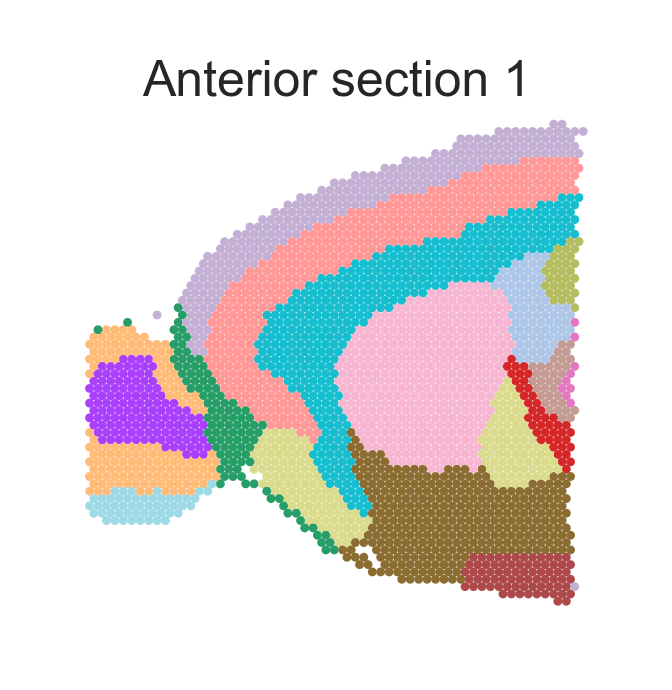

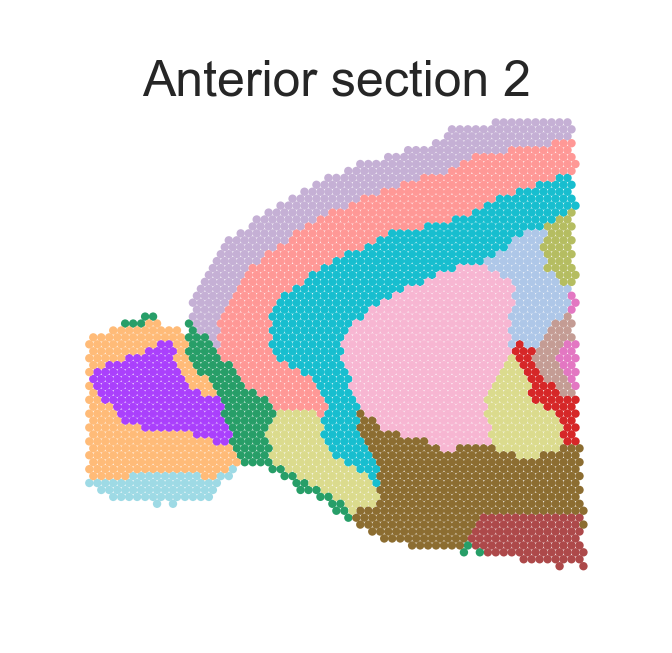

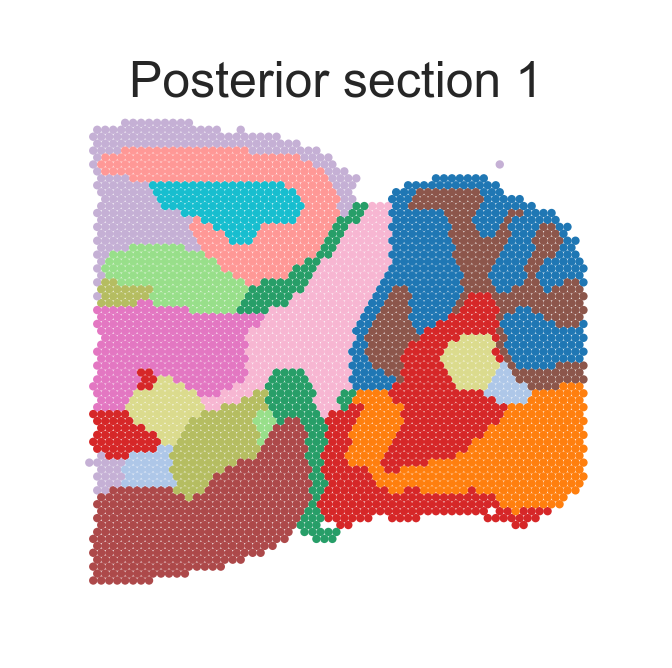

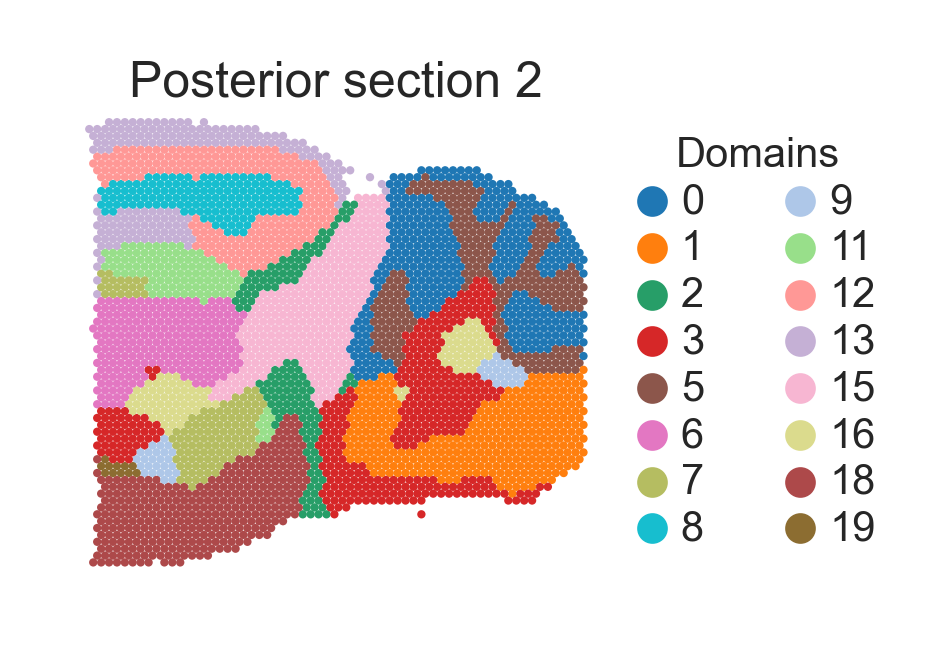

In [75]:
raw_adatas_wSpaSEG = []
for i, _sample_id in enumerate(sample_ids):
    _adata = adata[adata.obs['batch']==_sample_id]
    
    # read raw data for image
    _raw_adata = sc.read_h5ad(os.path.join(raw_data_root,raw_adata_fnames[i]))
    _raw_adata.obs['SpaSEG_clusters'] = _adata.obs['SpaSEG_clusters'].values
    raw_adatas_wSpaSEG.append(_raw_adata)
    
    fig,ax = plt.subplots(figsize=(utils.centimeter*3, utils.centimeter*3))
    
    sc.pl.spatial(_adata, color="SpaSEG_clusters", palette=_palette, show=False, ax=ax, img_key=None, frameon=False, alpha=1, size=1.5, spot_size =96.40082438014726)
    ax.set_title(titles[i],pad=0, y=1)

    if i<n_sample-1:
        ax.get_legend().remove()
    else:
        leg = ax.legend(loc='center left', bbox_to_anchor=[0.98, 0.5], ncol=2, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.6,title='Domains')
        leg.get_title().set_fontsize('5')
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_{i}_{_sample_id}_SpaSEG.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# Concat

In [17]:
from matplotlib.gridspec import GridSpec

def _concatplot(left_adata, left_title, right_adata, right_title):
    fig = plt.figure(figsize=(utils.centimeter*3.2*2, utils.centimeter*3))
    gs = GridSpec(1, 2, wspace=-0.07)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])

    sc.pl.spatial(left_adata, color="SpaSEG_clusters", 
              palette=_palette, show=False, ax=ax1, size=1.5, img_key='hires', frameon=False, alpha=1)
    ax1.set_title(left_title,pad=0, y=1.05)
    ax1.get_legend().remove()

    sc.pl.spatial(right_adata, color="SpaSEG_clusters", 
              palette=_palette, show=False, ax=ax2, size=1.5, img_key='hires', frameon=False, alpha=1)
    ax2.set_title(right_title,pad=0, y=1.05)
    ax2.get_legend().remove()

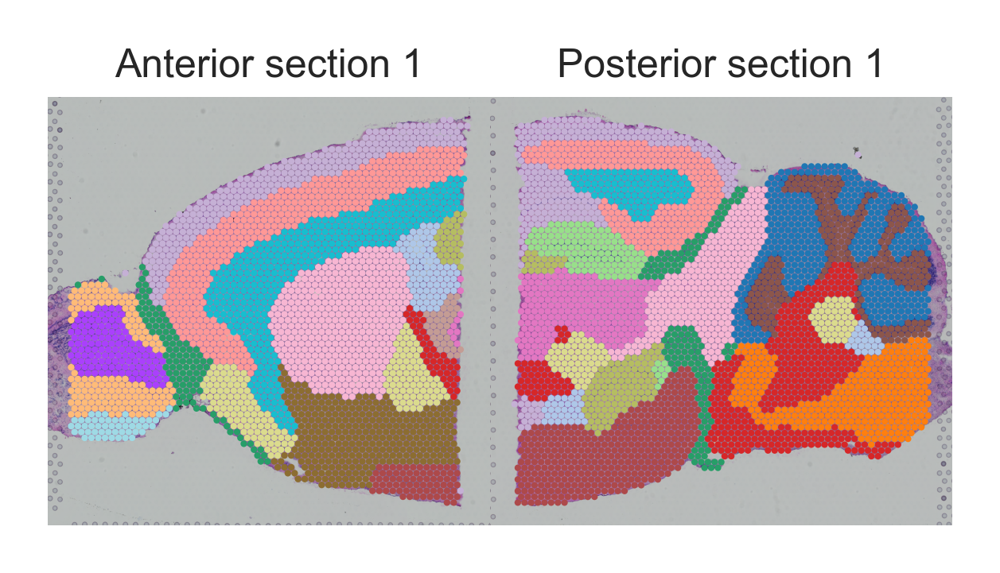

In [18]:
_concatplot(raw_adatas_wSpaSEG[0], titles[0], raw_adatas_wSpaSEG[2], titles[2])
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_concat_section1.pdf"), bbox_inches='tight', format='pdf', dpi=400)

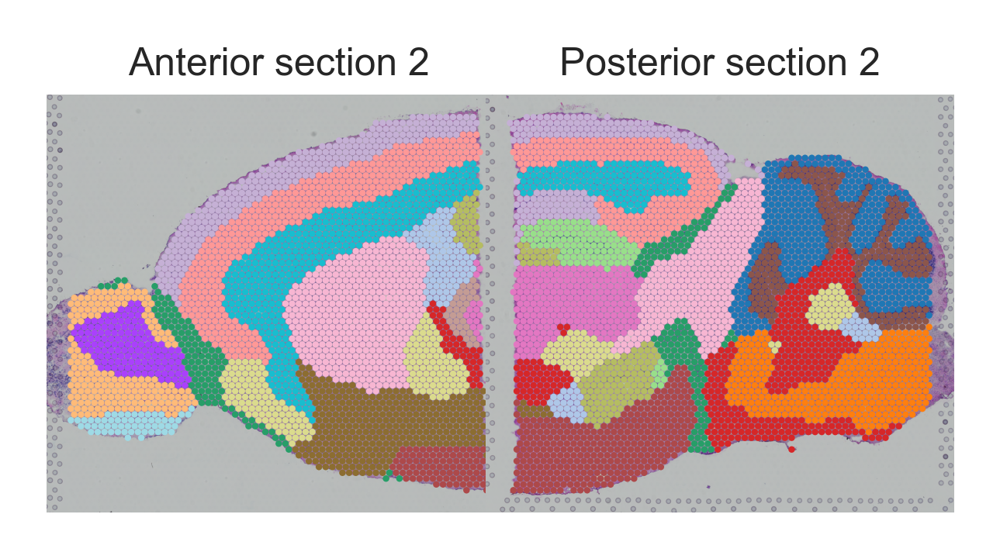

In [19]:
_concatplot(raw_adatas_wSpaSEG[1], titles[1], raw_adatas_wSpaSEG[3], titles[3])
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_concat_section2.pdf"), bbox_inches='tight', format='pdf', dpi=400)

# 3D plot

In [12]:
raw_adatas_wSpaSEG[0]

AnnData object with n_obs × n_vars = 2695 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'SpaSEG_clusters'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
import anndata as ad
def _crt_concat_adata(left_adata, left_id_add, right_data, right_id_add):
    _left_adata = left_adata.copy()
    _right_data = right_data.copy()
    
    _left_adata.var_names_make_unique()
    _right_data.var_names_make_unique()
    
    _left_coord = _left_adata.obsm['spatial']
    _left_coord_min = _left_coord.min(axis=0)
    _left_coord = _left_coord - _left_coord_min
    _left_coord_max = _left_coord.max(axis=0)
    
    _right_coord = _right_data.obsm['spatial']
    _right_coord_min = _right_coord.min(axis=0)
    _right_coord_max = _right_coord.max(axis=0)
    _right_coord = _right_coord - _right_coord_min
    
    _right_coord[:,0] = _right_coord[:,0] + _left_coord_max[0] 
#     _right_coord[:,1] = _right_coord[:,1] - 20
    
    _left_adata.obsm['spatial'] = _left_coord
    _right_data.obsm['spatial'] = _right_coord
    
    adata_map = {left_id_add:_left_adata,
                 right_id_add:_right_data}
    adatas = ad.concat(adata_map, join="inner", index_unique="_", label="batch")
    
    return adatas
    

In [14]:
_adata_s1 = _crt_concat_adata(raw_adatas_wSpaSEG[0],sample_ids[0], raw_adatas_wSpaSEG[2],sample_ids[2])
_adata_s1.obs['SpaSEG_clusters'] = _adata_s1.obs['SpaSEG_clusters'].astype('category')

/home/baiyong/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


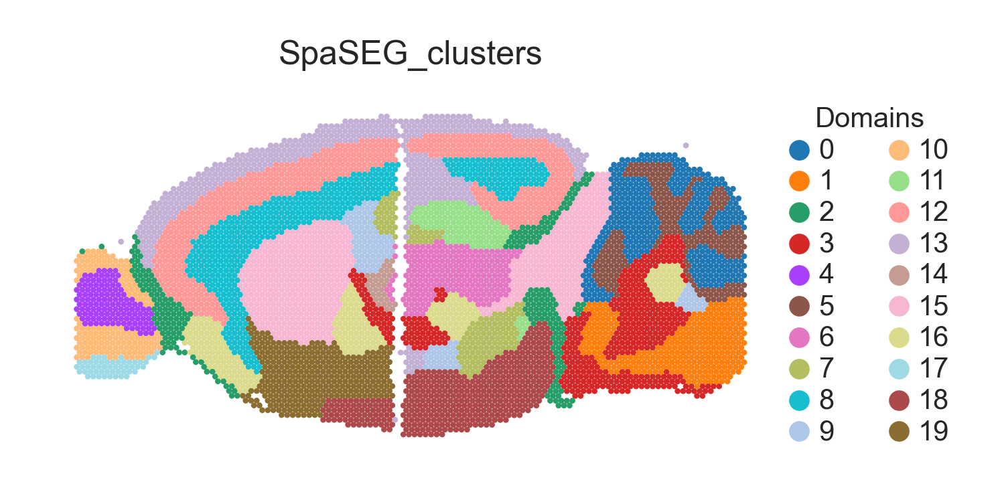

In [23]:
fig,ax = plt.subplots(figsize=(utils.centimeter*3*2, utils.centimeter*3))
sc.pl.spatial(_adata_s1, color="SpaSEG_clusters", palette=_palette,ax=ax,show=False, img_key=None, frameon=False, alpha=1, size=1.5, spot_size =96.40082438014726)
leg = ax.legend(loc='center left', bbox_to_anchor=[0.98, 0.5], ncol=2, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.6,title='Domains')
leg.get_title().set_fontsize('5')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_concat_section1_noimage.pdf"), bbox_inches='tight', format='pdf', dpi=400)

In [15]:
_adata_s2 = _crt_concat_adata(raw_adatas_wSpaSEG[1],sample_ids[1], raw_adatas_wSpaSEG[3],sample_ids[3])
_adata_s2.obs['SpaSEG_clusters'] = _adata_s2.obs['SpaSEG_clusters'].astype('category')

/home/baiyong/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


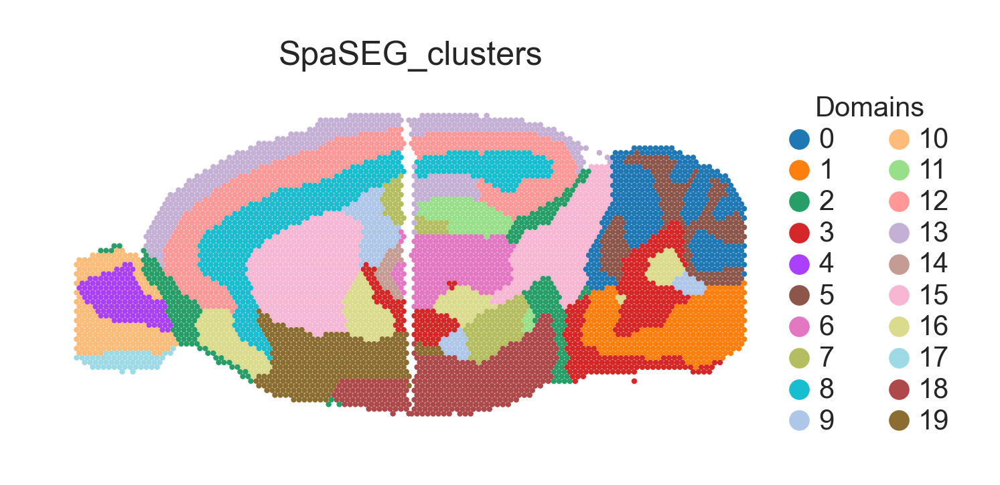

In [25]:
fig,ax = plt.subplots(figsize=(utils.centimeter*3*2, utils.centimeter*3))
sc.pl.spatial(_adata_s2, color="SpaSEG_clusters", palette=_palette,ax=ax,show=False, img_key=None, frameon=False, alpha=1, size=1.5, spot_size =96.40082438014726)
leg = ax.legend(loc='center left', bbox_to_anchor=[0.98, 0.5], ncol=2, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.6,title='Domains')
leg.get_title().set_fontsize('5')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_concat_section2_noimage.pdf"), bbox_inches='tight', format='pdf', dpi=400)

In [17]:
adata_merge = ad.concat({'S1':_adata_s1, 'S2':_adata_s2}, join="inner", index_unique="_", label="section")

In [18]:
coll = sc.pl.palettes.default_20
_palette = dict(zip(adata_merge.obs['SpaSEG_clusters'].cat.categories, coll[:len(adata_merge.obs['SpaSEG_clusters'].cat.categories)]))

# for 3D
colss = adata_merge.obs['SpaSEG_clusters'].map(_palette)

<ipython-input-73-b2ad8bd594e9>:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(),
<ipython-input-73-b2ad8bd594e9>:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(),rotation=-10,ha='left',va='baseline', rotation_mode="anchor")
<ipython-input-73-b2ad8bd594e9>:44: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=60,ha='right', va='center', rotation_mode="anchor")


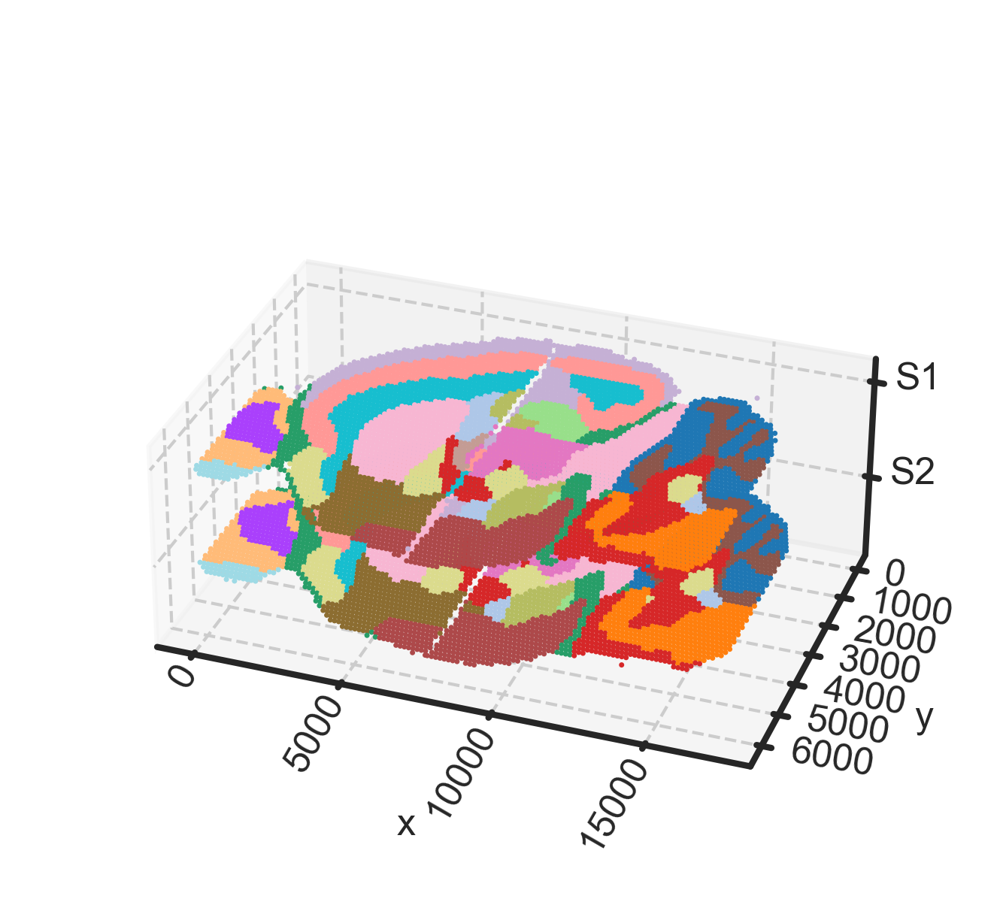

In [73]:
# https://jakevdp.github.io/PythonDataScienceHandbook/04.12-three-dimensional-plotting.html
from mpl_toolkits.mplot3d import Axes3D

sample_idss = [ 'S2','S1']
n_s = len(sample_idss)

fig = plt.figure(figsize=(utils.centimeter*6, utils.centimeter*6))
ax = fig.add_subplot(projection='3d')

for axis in [ax.xaxis, ax.yaxis, ax.zaxis]:
    axis._axinfo["grid"]['linewidth'] = .5
    axis._axinfo["grid"]['linestyle'] = "--"
#     axis._axinfo['tick']['inward_factor'] =0.05
#     axis._axinfo['tick']['outward_factor'] =0.05
#     axis._axinfo['tick']['width'] = 0.25
    
# for axis in [ax.w_xaxis, ax.w_yaxis, ax.w_zaxis]:
#     axis.line.set_linewidth(0.8)
#     axis.line.set_color('grey')
x,y = adata_merge.obsm['spatial'][:,0],adata_merge.obsm['spatial'][:,1]
z = -adata_merge.obs["section"].cat.codes + n_s
ax.scatter(x, y, z, c = colss, s=2.8, marker='.',alpha=1, rasterized=True, edgecolors='none')

# first 3 params are used to adjust scales of the three axes: x, y,z
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([1.2,.8,0.6,1]))

# first param: up_down rotation, second param: left_right rotation
ax.view_init(30, -70)

ax.set_zticks(list(range(1, n_s+1)))
ax.set_zlim([0.2,n_s+0.2])
ax.set_zticklabels(sample_idss,ha='left',va='center')
ax.zaxis.set_tick_params(pad=-6)

ax.set_xlim(ax.get_xlim()[0],ax.get_xlim()[1])
ax.set_ylim(ax.get_ylim()[1]-1800,ax.get_ylim()[0])
ax.set_yticklabels(ax.get_yticklabels(), 
                verticalalignment='baseline',
                horizontalalignment='left')
ax.set_yticklabels(ax.get_yticklabels(),rotation=-10,ha='left',va='baseline', rotation_mode="anchor")
ax.yaxis.set_tick_params(pad=-5)
ax.set_ylabel('y',labelpad=-8)

ax.set_xticklabels(ax.get_xticklabels(),rotation=60,ha='right', va='center', rotation_mode="anchor")
ax.xaxis.set_tick_params(pad=-6)
ax.set_xlabel('x', labelpad=-2)

plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_3d.pdf"), bbox_inches='tight', format='pdf', dpi=400)

# Compare methods

In [22]:
# here we just compare
methods_list=["SpaSEG",'Harmony','LIGER']
emdeddings = ['SpaSEG_embedding', 'X_Harmony', 'H_liger']

In [23]:
for rep in emdeddings:
    sc.pp.neighbors(adata, use_rep=rep, key_added="neighbor_"+rep)

In [24]:
# run leiden, to get 20 categories
sc.tl.leiden(adata,resolution=0.699, key_added = 'X_Harmony_leiden',neighbors_key="neighbor_X_Harmony")
sc.tl.leiden(adata,resolution=0.4, key_added = 'H_liger_leiden',neighbors_key="neighbor_H_liger")


In [25]:
adata.obs['X_Harmony_leiden'] = adata.obs['X_Harmony_leiden'].astype(int).astype('category')
adata.obs['H_liger_leiden'] = adata.obs['H_liger_leiden'].astype(int).astype('category')

## Samples (Batch)

In [26]:
cols = utils.react_cols_10[:5]
cols.extend(utils.react_cols_10[7:9])
cols.append('#666666')
cols[0] = utils.norm_12[8]
sns.color_palette(cols)

[(0.34901960784313724, 0.32941176470588235, 0.8392156862745098),
 (0.1607843137254902, 0.6509803921568628, 0.20392156862745098),
 (0.8196078431372549, 0.596078431372549, 0.043137254901960784),
 (0.8274509803921568, 0.23921568627450981, 0.09019607843137255),
 (0.615686274509804, 0.24705882352941178, 0.615686274509804),
 (0.5568627450980392, 0.6941176470588235, 0.1450980392156863),
 (0.5803921568627451, 0.4, 0.2196078431372549),
 (0.4, 0.4, 0.4)]

/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


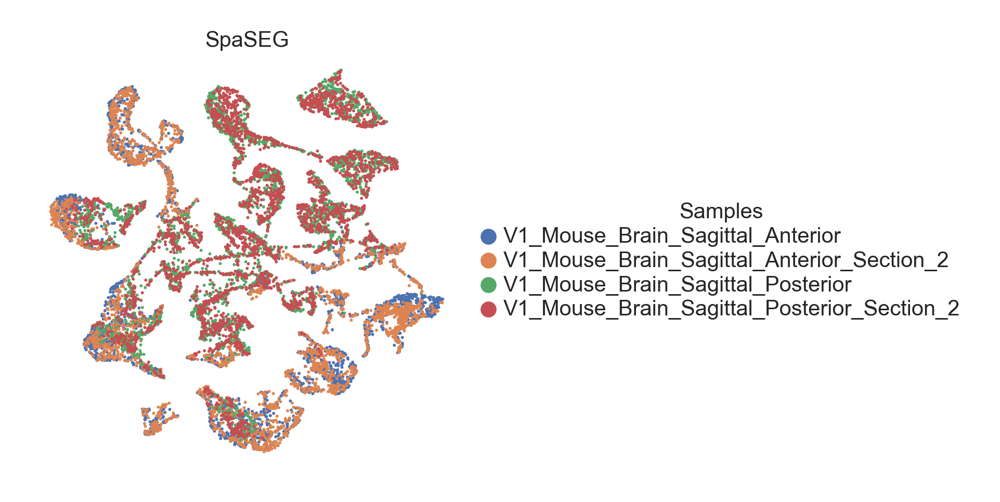

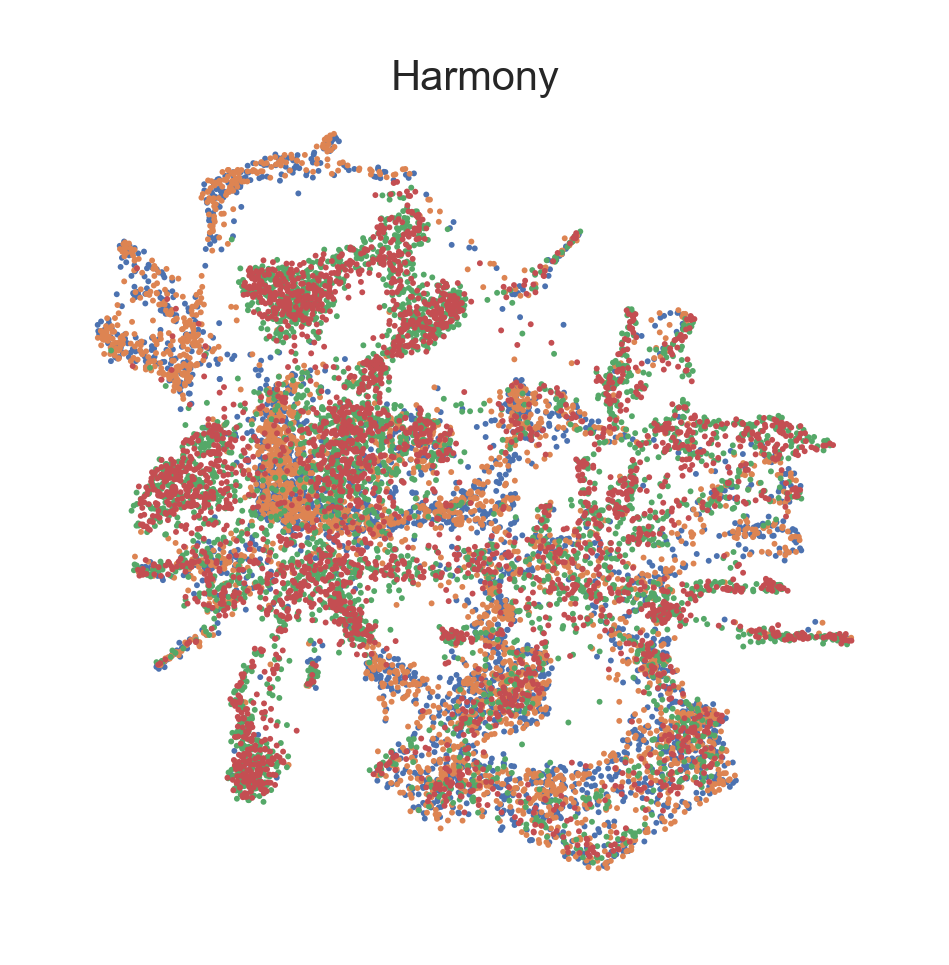

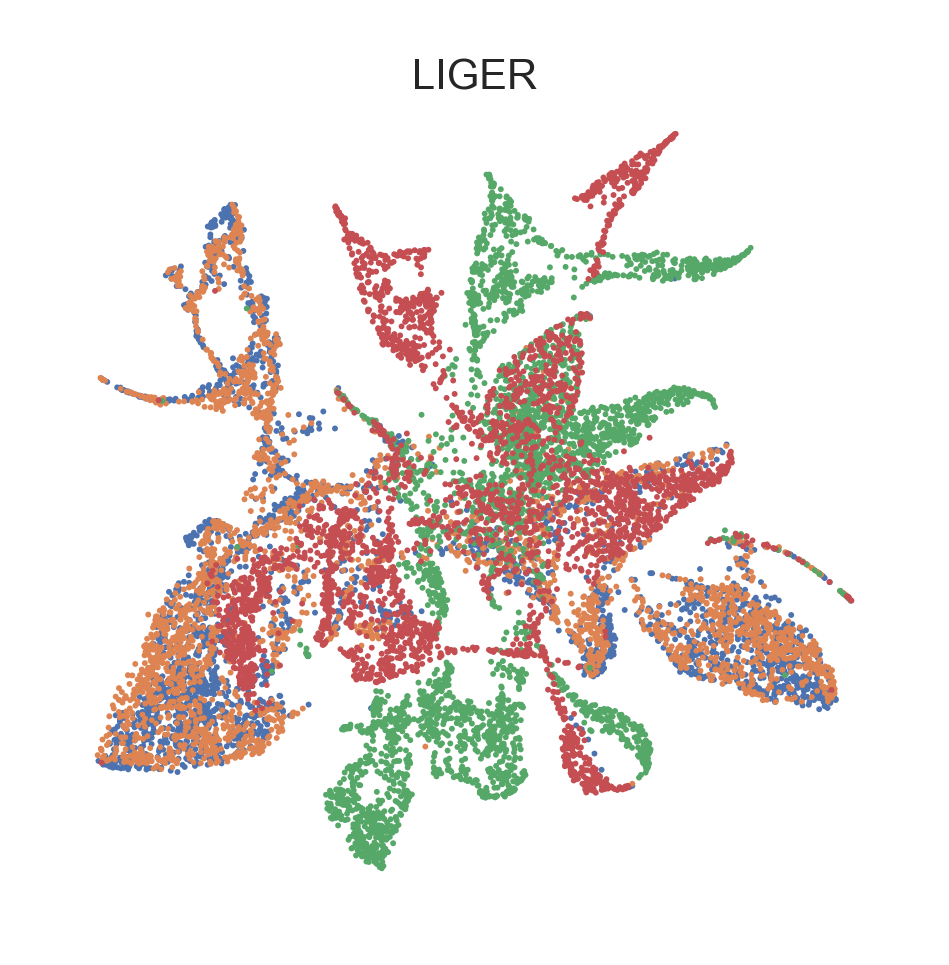

In [33]:
sample_ids = [
    'V1_Mouse_Brain_Sagittal_Anterior', 'V1_Mouse_Brain_Sagittal_Anterior_Section_2', 
    'V1_Mouse_Brain_Sagittal_Posterior', 'V1_Mouse_Brain_Sagittal_Posterior_Section_2']

_palette_samples=dict(zip(sample_ids, cols[1:5]))
for i,(_eb,title) in enumerate(zip(emdeddings,methods_list)):
    fig,ax = plt.subplots(figsize=(utils.centimeter*4.5, utils.centimeter*4.5))
    sc.tl.umap(adata, neighbors_key="neighbor_"+_eb)
    sc.pl.umap(adata, ax=ax, color='batch',
                          frameon=False,show=False,edgecolor='none',size=2)
    ax.set_title(title,fontsize=5,pad=0)
    
    if i==0:
        leg = ax.legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=1, frameon=False, 
           markerscale=0.6, labelspacing=0.2, fontsize=5,
          handleheight= 0.8, handlelength=0.6,title='Samples')
        leg.get_title().set_fontsize('5')
    else:
        ax.get_legend().remove()
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_umap_batch_{title}.pdf"), bbox_inches='tight', format='pdf', dpi=400)

/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/baiyong/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


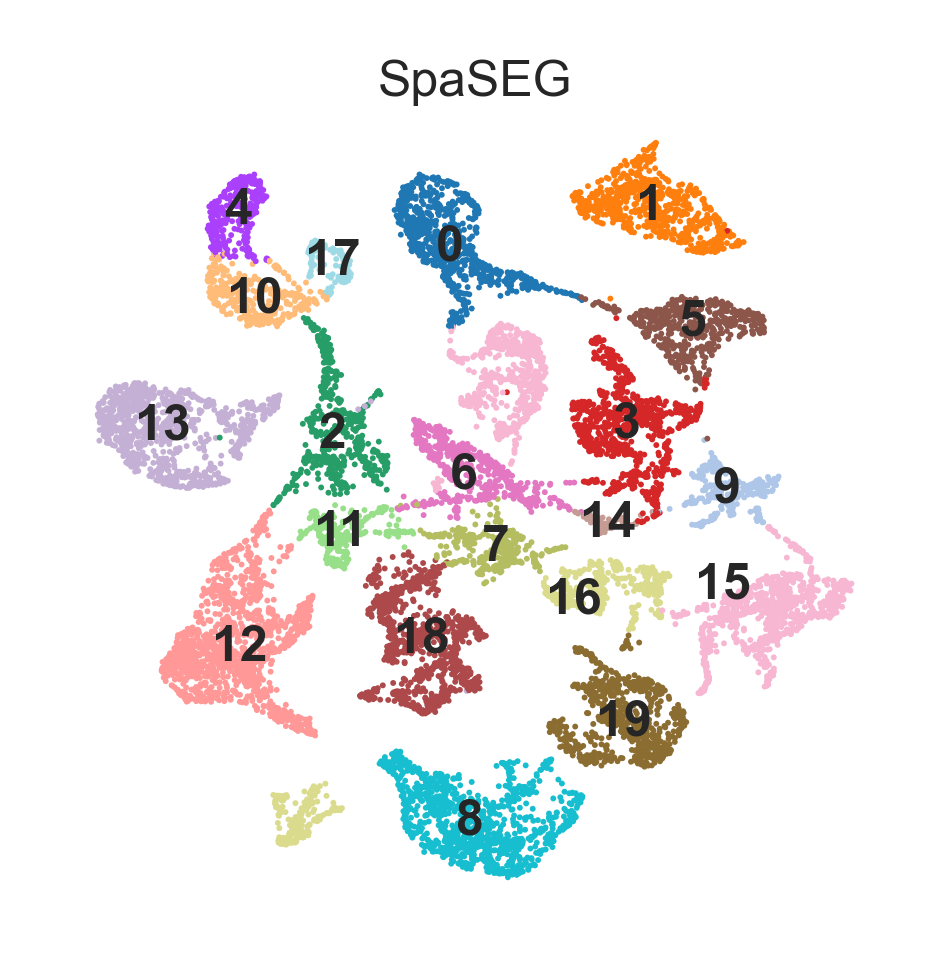

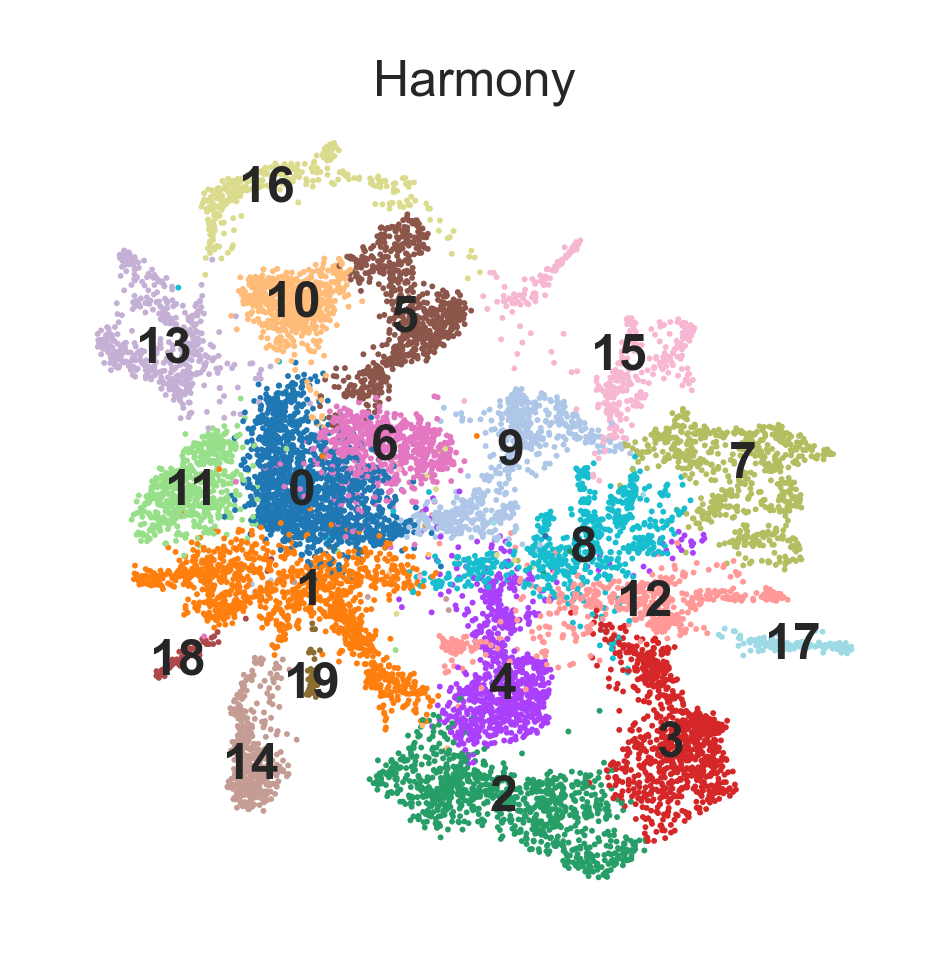

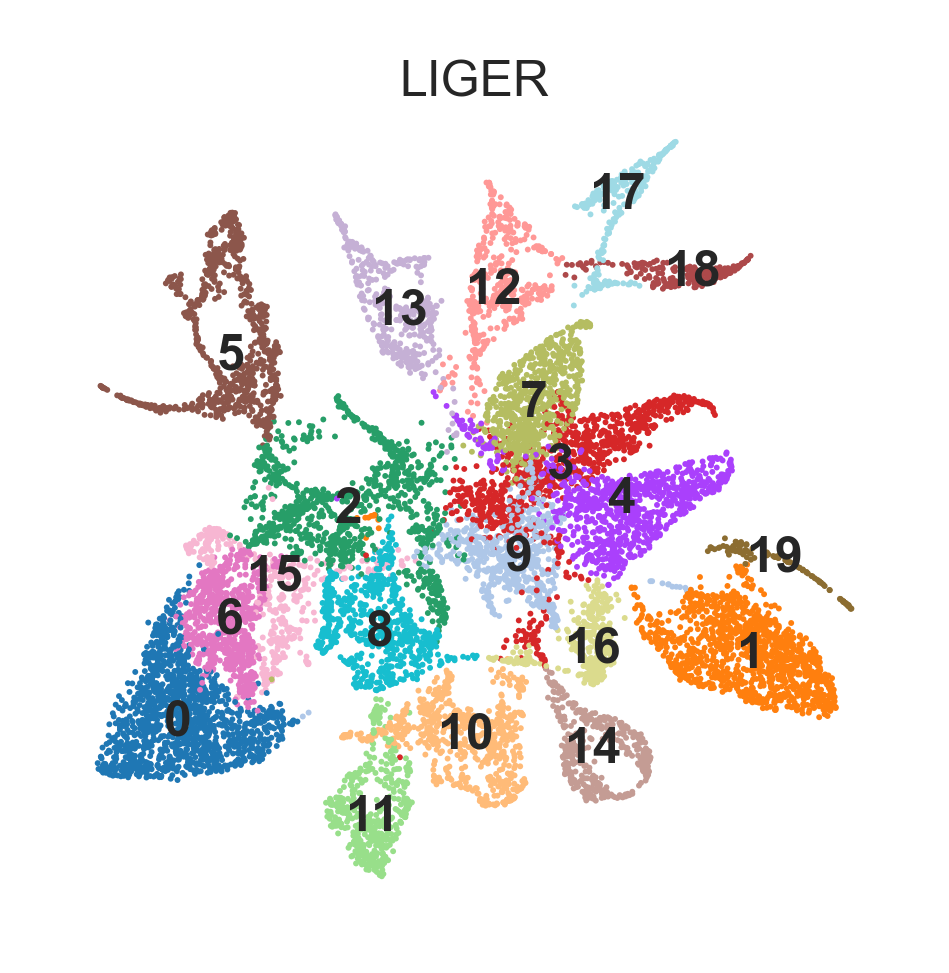

In [34]:
# method = 'SpaSEG'
# fig,ax = plt.subplots(figsize=(utils.centimeter*4, utils.centimeter*4))
# sc.pl.embedding(adata, basis=f'X_umap_{method}',color='SpaSEG_clusters', palette=ss_col_palette,neighbors_key=f"neighbor_{method}",ax=ax, legend_loc='on data',
#                           frameon=False,show=False,edgecolor='none',size=12000/len(adata.obs))
# ax.set_title('SpaSEG',fontsize=5,pad=0)

# plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Supp_baseline_umap_MO_SpaSEG_label.pdf"), bbox_inches='tight', format='pdf', dpi=300)
method_label = ['SpaSEG_clusters', 'X_Harmony_leiden', 'H_liger_leiden']
for i,(_eb,title) in enumerate(zip(emdeddings,methods_list)):
    fig,ax = plt.subplots(figsize=(utils.centimeter*4.5, utils.centimeter*4.5))

    sc.tl.umap(adata, neighbors_key="neighbor_"+_eb)
    sc.pl.umap(adata, ax=ax, color=method_label[i], palette=_palette, legend_loc='on data',
                          frameon=False,show=False,edgecolor='none',size=2)#12000/len(adata.obs))
    ax.set_title(title,fontsize=6,pad=0)
    
    plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_umap_{title}_label.pdf"), bbox_inches='tight', format='pdf', dpi=400)


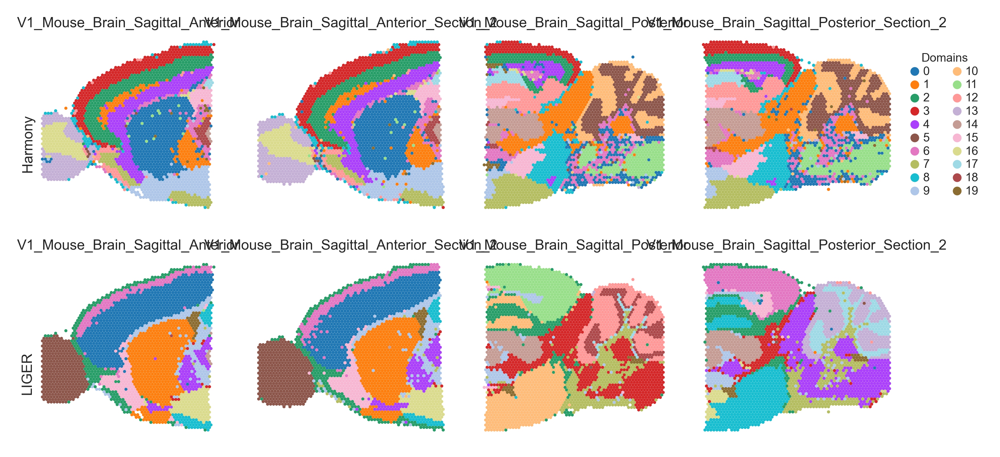

In [44]:

methods_list=["SpaSEG",'Harmony','LIGER']
emdeddings = ['SpaSEG_embedding', 'X_Harmony', 'H_liger']
method_label = ['SpaSEG_clusters', 'X_Harmony_leiden', 'H_liger_leiden']

sample_ids = [
    'V1_Mouse_Brain_Sagittal_Anterior', 'V1_Mouse_Brain_Sagittal_Anterior_Section_2', 
    'V1_Mouse_Brain_Sagittal_Posterior', 'V1_Mouse_Brain_Sagittal_Posterior_Section_2']

n_smaple = len(sample_ids)
n_algo = len(methods_list[1:])
title_list=methods_list[1:]
fig,axs = plt.subplots(n_algo, n_smaple, 
                       figsize=(utils.centimeter*17, utils.centimeter*4*n_algo),
                      gridspec_kw={'wspace': 0, 'hspace':0.2})
for j, _sample in enumerate(sample_ids):
    _adata = adata[adata.obs['batch']==_sample]
    for i,_algo in enumerate(method_label[1:]): 
        _title= title_list[i]        
        
        sc.pl.spatial(_adata, color=_algo, show=False, ax=axs[i,j],spot_size =96.40082438014726, size=1.5, img_key=None, frameon=False)
        
        axs[i,j].set_title(_sample,pad=2, y=1)
        if j==0:
            axs[i,j].text(_adata.obsm['spatial'][:,0].min()-1000, _adata.obsm['spatial'][:,1].max()-1800, f'{_title}',rotation='vertical')
        
        if j == n_smaple-1 and i == 0:
            leg = axs[i,j].legend(loc='center left', bbox_to_anchor=[1, 0.5], ncol=2, frameon=False, markerscale=0.6, labelspacing=0.2, fontsize=5,
                            handleheight= 0.8, handlelength=0.6,title='Domains')
            leg.get_title().set_fontsize('5')
        else:
            axs[i,j].get_legend().remove()
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_spatial_HarmonyLiger.pdf"), bbox_inches='tight', format='pdf', dpi=300)

# Calculate Metrics

In [45]:
adata

AnnData object with n_obs × n_vars = 12164 × 17218
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'batch', 'SpaSEG_discrete_clusters', 'SpaSEG_clusters', 'X_Harmony_leiden', 'H_liger_leiden'
    uns: 'neighbor_SpaSEG_embedding', 'neighbor_X_Harmony', 'neighbor_H_liger', 'leiden', 'umap', 'batch_colors', 'SpaSEG_clusters_colors', 'X_Harmony_leiden_colors', 'H_liger_leiden_colors'
    obsm: 'H_liger', 'SpaSEG_embedding', 'X_Harmony', 'X_pca', 'spatial', 'X_umap'
    obsp: 'neighbor_SpaSEG_embedding_distances', 'neighbor_SpaSEG_embedding_connectivities', 'neighbor_X_Harmony_distances', 'neighbor_X_Harmony_connectivities', 'neighbor_H_liger_distances', 'neighbor_H_liger_connectivities'

## LISI

In [46]:

methods_list=["SpaSEG",'Harmony','LIGER']
emdeddings = ['SpaSEG_embedding', 'X_Harmony', 'H_liger']
method_label = ['SpaSEG_clusters', 'X_Harmony_leiden', 'H_liger_leiden']

In [226]:
"""
lisi = compute_lisi(adata.obsm['SpaSEG_embedding'], adata.obs,['batch', 'SpaSEG_clusters'], perplexity=1500)
lisi.mean(axis=0)
# array([3.1192938 , 1.70237177])

lisi = compute_lisi(adata.obsm['X_Harmony'], adata.obs,['batch', 'X_Harmony_leiden'], perplexity=1500)
lisi.mean(axis=0)
# array([3.6124588, 4.1294525])
xx = []
lisi_b = []
lisi_d = []
for x in range(150, 300, 5):
    lisi = compute_lisi(adata.obsm['SpaSEG_embedding'], adata.obs,['batch', 'SpaSEG_clusters'], perplexity=x)
    xx.append(x)
    lisi_mean = lisi.mean(axis=0)
    lisi_b.append(lisi_mean[0])
    lisi_d.append(lisi_mean[1])
"""

# SpaSEG lisi tuning

perplexity	lisi_b	lisi_d
0	150	2.334723	1.048389
1	155	2.344918	1.049242
2	160	2.354822	1.050096
3	165	2.364477	1.050963
4	170	2.373851	1.051850
5	175	2.383007	1.052760
6	180	2.391932	1.053687
7	185	2.400613	1.054636
8	190	2.409077	1.055612
9	195	2.417341	1.056610
10	200	2.425427	1.057642
11	205	2.433316	1.058706
12	210	2.441036	1.059790
13	215	2.448585	1.060902
14	220	2.455944	1.062044
15	225	2.463159	1.063209
16	230	2.470198	1.064402
17	235	2.477084	1.065624
18	240	2.483850	1.066870
19	245	2.490474	1.068140
20	250	2.496975	1.069428
21	255	2.503342	1.070738
22	260	2.509598	1.072078
23	265	2.515709	1.073440
24	270	2.521724	1.074821
25	275	2.527634	1.076219
26	280	2.533431	1.077632
27	285	2.539133	1.079073
28	290	2.544729	1.080528
29	295	2.550237	1.082000

In [69]:
from sklearn.preprocessing import MinMaxScaler
lisi_df = None
for i, (_eb,_clusters) in enumerate(zip(emdeddings, method_label)):
    _lisi = compute_lisi(adata.obsm[_eb], adata.obs,['batch', _clusters], perplexity=3000) 
    _lisi_batch,_lisi_domain = _lisi[:,0],_lisi[:,1]
    
    _lisi_batch_norm = (MinMaxScaler().fit_transform(np.expand_dims(_lisi_batch,axis=1))).squeeze()
    _lisi_domain_norm = (MinMaxScaler().fit_transform(np.expand_dims(_lisi_domain,axis=1))).squeeze()
    
    f1_lisi = 2*(1-_lisi_domain_norm)*_lisi_batch_norm/(1-_lisi_domain_norm+_lisi_batch_norm)
    
    tmp_df = pd.DataFrame({
        'lisi_batch':_lisi_batch, 
        'lisi_domain':_lisi_domain,
        'f1_lisi':f1_lisi
    })
    tmp_df['method']=_eb
    if i == 0:
        lisi_df = tmp_df
    else:
        lisi_df = pd.concat([lisi_df, tmp_df], axis=0)

In [72]:
lisi_df.to_csv(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_F1lisi.csv"), index=False)

In [73]:
# LISI calculation code script, see _multisection_Merfish_lisi.py
lisi_df = pd.read_csv(os.path.join(wk_root,"notebook/results/Multisection/Mouse_Brain_F1lisi.csv"))

In [70]:
lisi_df.groupby(['method']).agg(['min','max','mean','median','std'])

lisi_batch                                          \
                        min       max      mean    median       std   
method                                                                
H_liger            2.288212  3.999890  3.095429  2.974235  0.421810   
SpaSEG_embedding   2.401248  3.999874  3.371944  3.539081  0.503619   
X_Harmony          3.081158  3.999528  3.765085  3.820076  0.194166   

                 lisi_domain                                          f1_lisi  \
                         min        max      mean    median       std     min   
method                                                                          
H_liger             1.764743  12.046000  3.920359  3.763102  1.413742     0.0   
SpaSEG_embedding    1.530049  10.073020  2.505205  2.213554  1.001831     0.0   
X_Harmony           2.657509  14.245443  5.891790  5.725409  2.042661     0.0   

                                                          
                       max      mean    median       std  
method                                                    
H_liger           0.939469  0.545343  0.533512  0.177631  
SpaSEG_embedding  0.998987  0.667940  0.743014  0.269283  
X_Harmony         0.964652  0.692693  0.702228  0.150351

In [52]:
from statannotations.Annotator import Annotator
bg_f = ['#ffb482', '#8de5a1','#fab0e4' , '#d0bbff', '#debb9b', '#ff9f9b', '#cfcfcf', '#fffea3', '#b9f2f0']
ln_f = ['#ff7c00', '#1ac938','#f14cc1' , '#8b2be2', '#9f4800', '#e8000b', '#a3a3a3', '#ffc400', '#00d7ff']
def _boxplot(data, x, y, orders, ax, bg_f, ln_f,comp_pairs, showfliers=True):
    
    plot_param={
        'data':data,
        'x':x,
        'y':y,
        'order':orders
    }
    
    palette = dict(zip(orders, bg_f))
    
    print(palette)
    
    axa = sns.boxplot(**plot_param,
                          ax=ax, palette=palette,
                          showfliers=showfliers, 
                          flierprops={"marker": ".",'markersize': 1},
                          linewidth=0.8,
                          width=0.6,saturation=1,showcaps=False)
    
    for i,artist in enumerate(ax.patches): #In matplotlib 3.5 the boxes are stored in ax.patches instead of ax.artists.
        # Set the linecolor on the artist to the facecolor, and set the facecolor to None
        # col = artist.get_facecolor()
        # artist.set_edgecolor(col)
        # artist.set_facecolor('None')
        artist.set_edgecolor(ln_f[i])
    
        # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same colour as above
        if showfliers:
            off_sets = 4
        else:
            off_sets = 3
        for j in range(i*off_sets,i*off_sets+off_sets):
            line = axa.lines[j]
            # line.set_color(col)
            # line.set_mfc(col)
            # line.set_mec(col)

            line.set_color(ln_f[i])
            line.set_mfc(ln_f[i])
            line.set_mec(ln_f[i])
    annot = Annotator(axa, pairs=comp_pairs, **plot_param)
    annot.configure(test='Mann-Whitney', comparisons_correction="BH", text_format='star', 
                    line_width=0.5,fontsize=5,loc='inside',line_height=0.03, text_offset=0.5)
    annot.apply_and_annotate()
    
    
    xticklabels = axa.set_xticklabels(axa.get_xticklabels(),rotation=30, ha='right',rotation_mode="anchor")
    for i, xticklabel in enumerate(xticklabels):
        xticklabel.set_y(xticklabel.get_position()[1] +  0.01)
    axa.tick_params(direction='out', length=3, pad=3, width=1)
#     plt.grid(color='0.9',linewidth=0.5)
    sns.despine()
    plt.xlabel(None)
    plt.ylabel(None)

    return axa

{'SpaSEG_embedding': '#ffb482', 'X_Harmony': '#8de5a1', 'H_liger': '#fab0e4'}
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

SpaSEG_embedding vs. X_Harmony: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.119e-10 U_stat=7.737e+07
SpaSEG_embedding vs. H_liger: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=9.608e+07


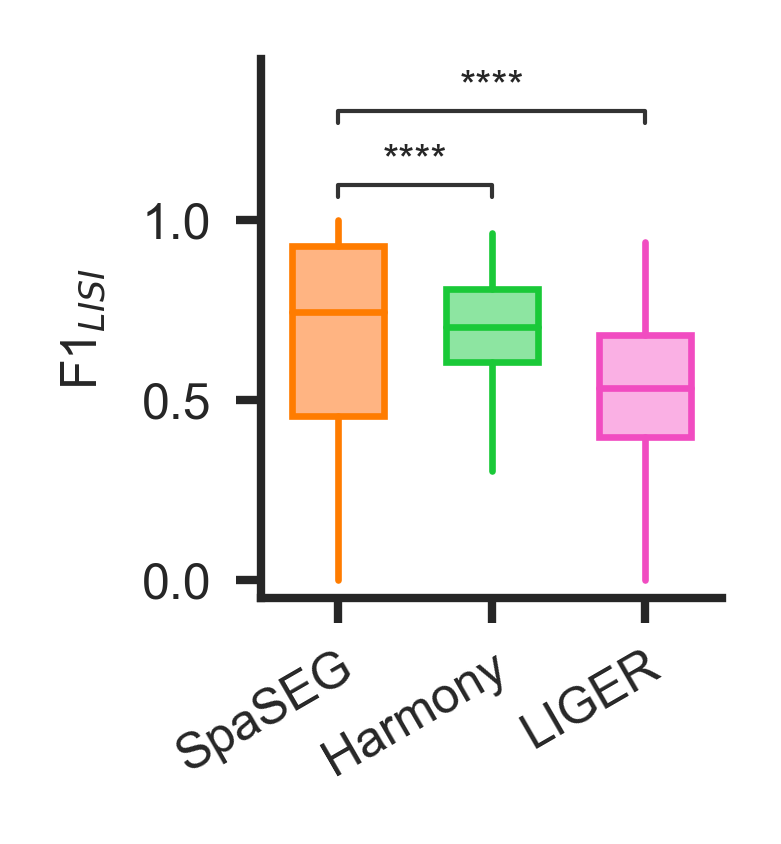

In [76]:
fig,ax = plt.subplots(figsize=(utils.centimeter*2.5, utils.centimeter*3))
axa=_boxplot(lisi_df, 'method', 'f1_lisi', emdeddings, ax, 
             bg_f[:len(emdeddings)], ln_f[:len(emdeddings)],
             comp_pairs = [("SpaSEG_embedding","X_Harmony"),("SpaSEG_embedding","H_liger")],showfliers=False)
ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_ylabel(r'F1$_{LISI}$')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_F1LISI.pdf"), bbox_inches='tight', format='pdf', dpi=400)

## Sihouette Score

In [142]:
methods_list=["SpaSEG",'Harmony','LIGER']
emdeddings = ['SpaSEG_embedding', 'X_Harmony', 'H_liger']
method_label = ['SpaSEG_clusters', 'X_Harmony_leiden', 'H_liger_leiden']

In [143]:
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.preprocessing import MinMaxScaler

In [144]:
# https://www.pnas.org/doi/10.1073/pnas.1820006116
def silhouette_coeff_point(adata, method_use='', batch_key='batch', domain_key='domain_cluster'):

    asw_batch = silhouette_samples(adata.obsm[method_use], adata.obs[batch_key])
    asw_domain = silhouette_samples(adata.obsm[method_use], adata.obs[domain_key])
    
    df = pd.DataFrame({'asw_batch':asw_batch, 'asw_domain': asw_domain})
    df['method_use']=method_use
    return df

In [145]:
df_spaseg=silhouette_coeff_point(adata, method_use='SpaSEG_embedding', batch_key='batch', domain_key='SpaSEG_clusters')
df_harmony=silhouette_coeff_point(adata, method_use='X_Harmony', batch_key='batch', domain_key='X_Harmony_leiden')
df_liger=silhouette_coeff_point(adata, method_use='H_liger', batch_key='batch', domain_key='H_liger_leiden')

In [146]:
df_spaseg['asw_batch_norm'] = 1-(df_spaseg['asw_batch']+1)/2
df_spaseg['asw_domain_norm'] = (df_spaseg['asw_domain']+1)/2

df_harmony['asw_batch_norm'] = 1-(df_harmony['asw_batch']+1)/2
df_harmony['asw_domain_norm'] = (df_harmony['asw_domain']+1)/2

df_liger['asw_batch_norm'] = 1-(df_liger['asw_batch']+1)/2
df_liger['asw_domain_norm'] = (df_liger['asw_domain']+1)/2

In [147]:
df_asw = pd.concat([df_spaseg, df_harmony,df_liger])
df_asw['f1_asw'] = 2*df_asw['asw_batch_norm']*df_asw['asw_domain_norm']/(df_asw['asw_batch_norm']+df_asw['asw_domain_norm'])

In [148]:
df_asw.to_csv(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_F1asw.csv"), index=False)

In [77]:
# calculation code script, see _multisection_Merfish_scoef.py
df_asw=pd.read_csv(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_F1asw.csv"))

In [78]:
df_asw

,asw_batch,asw_domain,method_use,asw_batch_norm,asw_domain_norm,f1_asw
0,-0.054234,0.660725,SpaSEG_embedding,0.527117,0.830363,0.644869
1,-0.011668,0.571650,SpaSEG_embedding,0.505834,0.785825,0.615483
2,-0.071590,0.811748,SpaSEG_embedding,0.535795,0.905874,0.673334
3,-0.006861,0.757342,SpaSEG_embedding,0.503430,0.878671,0.640112
4,-0.006456,0.754296,SpaSEG_embedding,0.503228,0.877148,0.639544
...,...,...,...,...,...,...
36487,0.011396,0.179232,H_liger,0.494302,0.589616,0.537769
36488,0.041474,0.117681,H_liger,0.479263,0.558840,0.516002
36489,0.050270,0.110600,H_liger,0.474865,0.555300,0.511943
36490,0.023682,0.691795,H_liger,0.488159,0.845898,0.619063


In [79]:
df_asw['asw_batch_norm'] = 1-(df_asw['asw_batch']+1)/2
df_asw['asw_domain_norm'] = (df_asw['asw_domain']+1)/2


In [80]:
df_asw['f1_asw'] = 2*df_asw['asw_batch_norm']*df_asw['asw_domain_norm']/(df_asw['asw_batch_norm']+df_asw['asw_domain_norm'])

In [81]:
df_asw

,asw_batch,asw_domain,method_use,asw_batch_norm,asw_domain_norm,f1_asw
0,-0.054234,0.660725,SpaSEG_embedding,0.527117,0.830363,0.644869
1,-0.011668,0.571650,SpaSEG_embedding,0.505834,0.785825,0.615483
2,-0.071590,0.811748,SpaSEG_embedding,0.535795,0.905874,0.673334
3,-0.006861,0.757342,SpaSEG_embedding,0.503430,0.878671,0.640112
4,-0.006456,0.754296,SpaSEG_embedding,0.503228,0.877148,0.639544
...,...,...,...,...,...,...
36487,0.011396,0.179232,H_liger,0.494302,0.589616,0.537769
36488,0.041474,0.117681,H_liger,0.479263,0.558840,0.516002
36489,0.050270,0.110600,H_liger,0.474865,0.555300,0.511943
36490,0.023682,0.691795,H_liger,0.488159,0.845898,0.619063


In [82]:
df_asw[['f1_asw','method_use']].groupby(['method_use']).agg(['min','max','mean','median','std'])

f1_asw                                        
                       min       max      mean    median       std
method_use                                                        
H_liger           0.303355  0.669689  0.540204  0.537652  0.049809
SpaSEG_embedding  0.328629  0.713494  0.630273  0.639161  0.034152
X_Harmony         0.418110  0.588178  0.515140  0.509822  0.026974

{'SpaSEG_embedding': '#ffb482', 'X_Harmony': '#8de5a1', 'H_liger': '#fab0e4'}
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

SpaSEG_embedding vs. X_Harmony: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=1.454e+08
SpaSEG_embedding vs. H_liger: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=1.390e+08


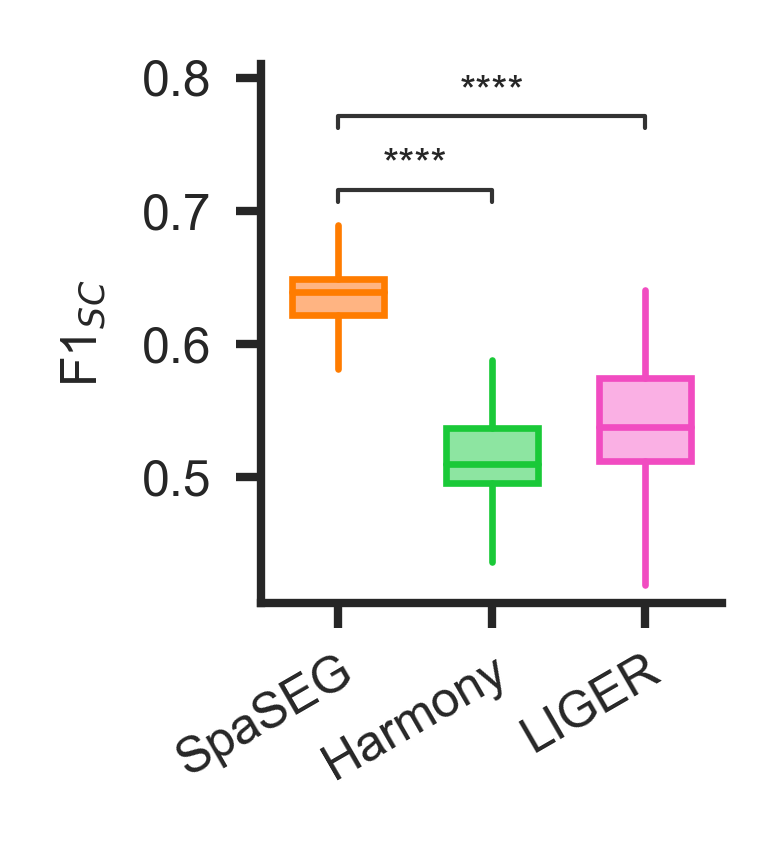

In [83]:
fig,ax = plt.subplots(figsize=(utils.centimeter*2.5, utils.centimeter*3))
axa=_boxplot(df_asw, 'method_use', 'f1_asw', emdeddings, ax, 
             bg_f[:len(emdeddings)], ln_f[:len(emdeddings)],
             comp_pairs = [("SpaSEG_embedding","X_Harmony"),("SpaSEG_embedding","H_liger")],showfliers=False)
ax.set_xticklabels(["SpaSEG",'Harmony','LIGER'])
ax.set_ylabel(r'F1$_{SC}$')
plt.savefig(os.path.join(wk_root, f"notebook/results/Multisection/Mouse_Brain_F1SC.pdf"), bbox_inches='tight', format='pdf', dpi=400)